In [1]:
import pandas as pd 
from os.path import join
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import random
import pylab
from scipy.ndimage import gaussian_filter1d
from scipy.signal import detrend
from statsmodels.tsa.stattools import adfuller
from scipy.optimize import leastsq
from sklearn.preprocessing import Normalizer
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from scipy.signal import find_peaks
import scipy.fft as fft
import itertools
import numpy as np
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [18]:
data_dir = join('..', 'Data')
files = !ls $data_dir
files = [f for f in files if f.endswith('.csv')]
# files = random.sample(files, 8)
# files

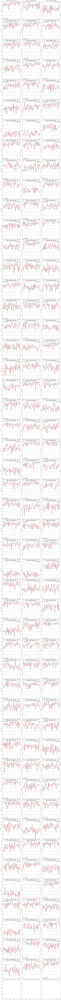

In [19]:
fig, axs = plt.subplots(1+len(files)//3, 3, figsize=(15, 5 * len(files)//3), sharey=True)
axs = axs.flatten()
fig.tight_layout()
aggregated = list()

for idx, f in enumerate(files):
    data = pd.read_csv(join(data_dir, f))

    block_no = list()
    curr_block_no = 1
    for row in data.iterrows():
        row_no, row_data = row
        prev_row = data.iloc[row_no - 1]

        if row_no in [0, 1]:
            row_block_no = 0
        elif (row_data.Trial_type == 'training' and prev_row.Trial_type in ['experiment', 'no_adaptation']):
            curr_block_no += 1
        row_block_no = curr_block_no 

        block_no.append(row_block_no)
    data['Block_no'] = block_no

    # data["Block_no"] = 0
    # assert data.shape[0] == 590, f
    # for i in list(range(11)): # add block no
    #     data[50*i + 40:50*(i+1) + 40].Block_no = i+1

    experiment = data.query("Trial_type == 'experiment'")
    no_adaptation = data.query("Trial_type == 'no_adaptation'")

    acc = experiment.groupby("CSI").mean().Corr.to_numpy()

    t = np.round((np.arange(acc.shape[0]) * 8.666666666) + 400)
    axs[idx].plot(t, acc, label=f'Original data', color='r')
    axs[idx].set_title(f"Part_ID: {id}" )
    axs[idx].set_ylabel("ACC")
    # axs[idx].set_xlim([400, 900])
    axs[idx].legend()
    axs[idx].grid()

    a = experiment.groupby('Block_no').mean()[['Stimulus Time', 'Corr']]
    a.reset_index(inplace=True)
    a['Part_id'] = f.split('_')[0]
    a = a.reindex(columns=['Part_id', 'Block_no', 'Corr','Stimulus Time'])
    aggregated.append(a)
# fig.savefig("Sacc_normalised.png")
# fix.legend()
pd.concat(aggregated).to_csv('Low_res_saccades.csv', index=False)
fig.show()

# Naive approach

Bunch of plots with behavioral data. Raw (black line) and gaussian blured (with different sigma values)

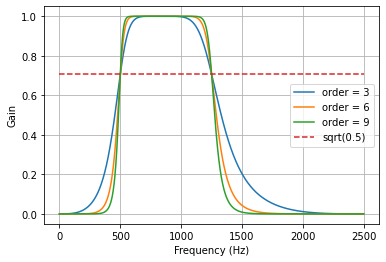

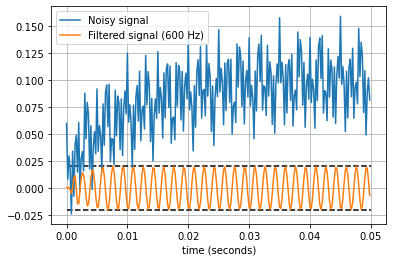

In [3]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


def run():
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = 5000.0
    lowcut = 500.0
    highcut = 1250.0

    # Plot the frequency response for a few different orders.
    plt.figure(1)
    plt.clf()
    for order in [3, 6, 9]:
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        w, h = freqz(b, a, worN=2000)
        plt.plot((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)

    plt.plot([0, 0.5 * fs], [np.sqrt(0.5), np.sqrt(0.5)],
             '--', label='sqrt(0.5)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')

    # Filter a noisy signal.
    T = 0.05
    nsamples = int(T * fs)
    t = np.linspace(0, T, nsamples, endpoint=False)
    a = 0.02
    f0 = 600.0
    x = 0.1 * np.sin(2 * np.pi * 1.2 * np.sqrt(t))
    x += 0.01 * np.cos(2 * np.pi * 312 * t + 0.1)
    x += a * np.cos(2 * np.pi * f0 * t + .11)
    x += 0.03 * np.cos(2 * np.pi * 2000 * t)
    plt.figure(2)
    plt.clf()
    plt.plot(t, x, label='Noisy signal')

    y = butter_bandpass_filter(x, lowcut, highcut, fs, order=6)
    plt.plot(t, y, label='Filtered signal (%g Hz)' % f0)
    plt.xlabel('time (seconds)')
    plt.hlines([-a, a], 0, T, linestyles='--')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc='upper left')

    plt.show()


run()

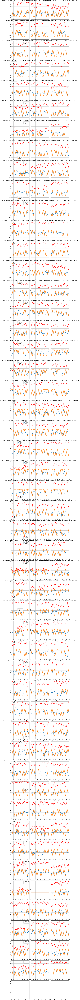

In [4]:
res = [["Part_id", "std", 'freq', 'sacc_value' ,'peaks','b2', 'b3', 'b4', 'b5','b6', 'b7', 'b8', 'b9', 'b10', 'b11']]
fig, axs = plt.subplots(1+len(files)//3, 3, figsize=(15, 5 * len(files)//3), sharey=True)
axs = axs.flatten()
fig.tight_layout()
fs = 48.0
lowcut = 12.0
highcut = 1.0
for idx, f in enumerate(files):
    data = pd.read_csv(join(data_dir, f))
    data["Block_no"] = 0
    assert data.shape[0] == 590, f
    for i in list(range(11)): # add block no
        data[50*i + 40:50*(i+1) + 40].Block_no = i+1
    original_data = data.query("Trial_type != 'training' and Block_no > 1")\
    .groupby("CSI").mean().Corr.to_numpy()
   
    detrended = detrend(original_data)
    scaled = 0.3*Normalizer().fit_transform(detrended.reshape((len(original_data), 1)))
    sacc_value = data.query("Trial_type != 'training' and Block_no == 1").Corr.mean()
    std = np.std(detrended)
    freq = len(list(itertools.groupby(scaled, lambda x: x>0.0)))
    peaks = find_peaks(original_data)
    b_loop = list()
    for i in range(2,12):
        b_loop.append(data.query("Trial_type != 'training' and Block_no == {}".format(i)).Corr.mean())
    w = [f.split('_')[0], std, freq, sacc_value, peaks] + b_loop
    res.append(w)

    t = np.round((np.arange(13,61) * 16.6666666))
    axs[idx].plot(t, original_data, label='Original data', color='r')
    axs[idx].plot(t, detrended, label='Detrended')
    axs[idx].plot(t, scaled, label='Scaled')
    axs[idx].set_title("Part_ID: " + f.split('_')[0] + f"|STD:{std:.4}|Freq:{freq}|Peaks:{peaks}" )
    axs[idx].set_ylabel("ACC")
    axs[idx].set_xlim([200,1000])
    # axs[idx].set_ylim([-0.3,0.3])
    # axs[idx].legend()
    axs[idx].grid()
    if idx % 3 == 0:
        axs[idx].legend()

fig.savefig("Sacc_normalised.png")
# fix.legend()
fig.show()

# Czy std powinno być miezone na sygnale surowym czy ustacjonarnionym ? 
# Daje liczbe zmian a nie liczbe cykli

In [ ]:
# res

In [9]:
# res
df = pd.DataFrame(res[1:], columns = res[0])

X = df[['std', 'freq', 'b2', 'b3', 'b4', 'b5', 'b6', 'b7', 'b8', 'b9', 'b10', 'b11']]
X = df[['b2', 'b3', 'b4', 'b5', 'b6', 'b7', 'b8', 'b9', 'b10', 'b11']]
X = df[['b10', 'b11']]
X = df[['b2', 'b3']]
X = df[['std', 'freq']]
# X = df['std', 'f']
Y = df['sacc_value']
df[['std', 'freq','peaks', 'sacc_value']].corr()

,std,freq,sacc_value
std,1.000000,0.354217,-0.227652
freq,0.354217,1.000000,0.126710
sacc_value,-0.227652,0.126710,1.000000


In [10]:
model = LinearRegression(normalize=True).fit(X, Y)
r_sq = model.score(X, Y)
print('coefficient of determination:', r_sq)
print('intercept:', model.intercept_)
print('slope:', model.coef_)


coefficient of determination: 0.10098667645304882
intercept: 0.7625382659938529
slope: [-2.43860732  0.01151851]


In [ ]:
 df.describe()

In [17]:
import statsmodels.api as sm
import pandas as pd
from sklearn import preprocessing
df = pd.DataFrame(res[1:], columns = res[0])
x = df[['std','freq','sacc_value']].values #returns a numpy array
min_max_scaler = preprocessing.StandardScaler()
x_scaled = min_max_scaler.fit_transform(x)
df = pd.DataFrame(x_scaled, columns =['std','freq','sacc_value'])

X = df[['std' ]]
Y = df['sacc_value']

X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(Y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             sacc_value   R-squared:                       0.052
Model:                            OLS   Adj. R-squared:                  0.045
Method:                 Least Squares   F-statistic:                     7.925
Date:                Mon, 26 Oct 2020   Prob (F-statistic):            0.00555
Time:                        11:20:18   Log-Likelihood:                -204.67
No. Observations:                 147   AIC:                             413.3
Df Residuals:                     145   BIC:                             419.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3.469e-17      0.081  -4.29e-16      1.000      -0.160       0.160
std           -0.2277      0.081     -2.815      0.006      -0.387      -0.068
==============================================================================
Omnibus:                       78.292   Durbin-Watson:                   1.822
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              314.958
Skew:                          -2.025   Prob(JB):                     4.05e-69
Kurtosis:                       8.918   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
def fit_sin(tt, yy):
    '''Fit sin to the input time sequence, and return fitting parameters "amp", "omega", "phase", "offset", "freq", "period" and "fitfunc"'''
    tt = np.array(tt)
    yy = np.array(yy)
    ff = np.fft.fftfreq(len(tt), (tt[1]-tt[0]))   # assume uniform spacing
    Fyy = abs(np.fft.fft(yy))
    guess_freq = abs(ff[np.argmax(Fyy[1:])+1])   # excluding the zero frequency "peak", which is related to offset
    guess_amp = np.std(yy) * 2.**0.5
    guess_offset = np.mean(yy)
    guess = np.array([guess_amp, 2.*np.pi*guess_freq, 0., guess_offset])

    def sinfunc(t, A, w, p, c):  return A * np.sin(w*t + p) + c
    popt, pcov = curve_fit(sinfunc, tt, yy, p0=guess, method='lm')
    A, w, p, c = popt
    f = w/(2.*np.pi)
    fitfunc = lambda t: A * np.sin(w*t + p) + c
    return {"amp": A, "omega": w, "phase": p, "offset": c, "freq": f, "period": 1./f, "fitfunc": fitfunc, "maxcov": np.max(pcov), "rawres": (guess,popt,pcov)}

data = scaled
res = fit_sin(t, data)

fine_t = np.arange(200,max(t),0.1)
data_fit = res['fitfunc'](fine_t) 

plt.plot(t, data, '.')
plt.plot(fine_t, data_fit, label='Curve fit')
plt.legend()
plt.show()
res

In [ ]:
N = 48 # number of data points
t = np.arange(N)
# f = 1.15247 # Optional!! Advised not to use
# data = 3.0*np.sin(f*t+0.001) + 0.5 + np.random.randn(N) # create artificial data with noise
data = detrended
guess_phase = np.pi
guess_freq = 0.08
guess_amp = 0.2

# we'll use this to plot our first estimate. This might already be good enough for you
fine_t = np.arange(0,max(t),0.1)
data_first_guess = guess_amp*np.sin(2.0*np.pi*guess_freq*fine_t+guess_phase)

# Define the function to optimize, in this case, we want to minimize the difference
# between the actual data and our "guessed" parameters
optimize_func = lambda x: x[0]*np.sin(2.0*np.pi*x[1]*t+x[2])  - data
est_amp, est_freq, est_phase = leastsq(optimize_func,[guess_amp, guess_freq, guess_phase])[0]

# recreate the fitted curve using the optimized parameters
data_fit = est_amp*np.sin(2.0*np.pi*est_freq*t+est_phase) 
# recreate the fitted curve using the optimized parameters

fine_t = np.arange(0,max(t),0.1)
data_fit=est_amp*np.sin(est_freq*fine_t+est_phase)

plt.plot(t, data, '.')
plt.plot(fine_t, data_first_guess, label='first guess')
plt.plot(fine_t, data_fit, label='after fitting')
plt.legend()
plt.show()


In [ ]:
N = 1000 # number of data points
t = np.linspace(0, 4*np.pi, N)
f = 1.15247 # Optional!! Advised not to use
data = 3.0*np.sin(f*t+0.001) + 0.5 + np.random.randn(N) # create artificial data with noise
# data = detrended
guess_mean = np.mean(data)
guess_std = 3*np.std(data)/(2**0.5)/(2**0.5)
guess_phase = 0.1
guess_freq = 1
guess_amp = 0.2

# we'll use this to plot our first estimate. This might already be good enough for you
data_first_guess = guess_std*np.sin(t+guess_phase) + guess_mean

# Define the function to optimize, in this case, we want to minimize the difference
# between the actual data and our "guessed" parameters
optimize_func = lambda x: x[0]*np.sin(x[1]*t+x[2]) + x[3] - data
est_amp, est_freq, est_phase, est_mean = leastsq(optimize_func,[guess_amp, guess_freq, guess_phase, guess_mean])[0]

# recreate the fitted curve using the optimized parameters
data_fit = est_amp*np.sin(est_freq*t+est_phase) + est_mean

# recreate the fitted curve using the optimized parameters

fine_t = np.arange(0,max(t),0.1)
data_fit=est_amp*np.sin(est_freq*fine_t+est_phase)+est_mean

plt.plot(t, data, '.')
plt.plot(t, data_first_guess, label='first guess')
plt.plot(fine_t, data_fit, label='after fitting',c='yellow')
plt.legend()
plt.show()


In [ ]:
x_data = t
y_data = detrended

from scipy import optimize

def test_func(x, a, b,c):
    return a * np.sin(2 * np.pi* b * x + c)

params, params_covariance = optimize.curve_fit(test_func, x_data, y_data,
                                               p0=[0.2, 2,2])


print(params)
plt.figure(figsize=(6, 4))
plt.scatter(x_data, y_data, label='Data')
plt.plot(np.linspace(200, 1000, 100), test_func(np.linspace(200, 1000, 100), params[0], params[1], params[2]),         label='Fitted function')

plt.legend(loc='best')

plt.show()

In [ ]:
# detrended
t_plot = np.linspace(200, 1000, 10000)
data = np.sin(2*np.pi*2.0 * t_plot)
def fun(x, t, y):
    return x[0] * np.sin(x[1] * t + x[2]) - y

def plot_fun(t,a,b,c):
    return a * np.sin(b*t + c)

x0 = np.array([1, 1.0, 1.0])
res_lsq = least_squares(fun, x0, method = 'lm', args=(t, np.sin(t)))
# print(res_lsq)
# t_test = np.linspace(t_min, t_max, n_points * 10)
# y_true = gen_data(t_test, a, b, c)

y_lsq = plot_fun(t_plot, *res_lsq.x)
# y_soft_l1 = gen_data(t_test, *res_soft_l1.x)
# y_log = gen_data(t_test, *res_log.x)


plt.plot(t_plot, data, 'o')
# plt.plot(t_test, y_true, 'k', linewidth=2, label='true')
# plt.plot(t_plot, y_lsq, label='linear loss')
# plt.plot(t_test, y_soft_l1, label='soft_l1 loss')
# plt.plot(t_test, y_log, label='cauchy loss')
plt.xlabel("t")
plt.ylabel("y")
plt.legend()
plt.show()

# Fourier-based visual inspection



In [ ]:
fig, axs = plt.subplots(1+len(files)//3, 3, figsize=(15,  3 * len(files)//3), sharey=True)
axs = axs.flatten()
N = 48 # Number of samplepoints
T = 1.0 / 60 # spacing

fig.tight_layout()
for idx, f in enumerate(files):
    data = pd.read_csv(join(data_dir, f))
    data["Block_no"] = 0
    assert data.shape[0] == 590
    for i in list(range(11)): # add block no
        data[50*i + 40:50*(i+1) + 40].Block_no = i+1

    original_data = data.query("Trial_type != 'training'").groupby("CSI").mean().Corr.to_numpy()
    # sig1 = original_data
    sig2 = gaussian_filter1d(original_data, 1)
    # sig3 = gaussian_filter1d(original_data, 4)
    # sig1 = fft.fft(sig1)
    sig2 = fft.fft(sig2)
    # sig3 = fft.fft(sig3)
    # power1 = np.abs(sig1) ** 2
    power2 = np.abs(sig2) ** 2
    # power3 = np.abs(sig3) ** 2
    # sample_freq1 = fft.fftfreq(sig1.size, d=T)
    sample_freq2 = fft.fftfreq(sig2.size, d=T)
    # sample_freq3 = fft.fftfreq(sig3.size, d=T)
    # axs[idx].bar(sample_freq1[1:]-0.4, power1[1:], color='r', align='center', width=0.4, label = "Original data")
    axs[idx].bar(sample_freq2[1:]+0.0, power2[1:], color='g', align='center', width=0.4, label = "Gaussian blur. Sigma=1")
    # axs[idx].bar(sample_freq3[1:]+0.4, power3[1:], color='b', align='center', width=0.4, label = "Gaussian blur. Sigma=4")
    axs[idx].set_xlim([1,21])
    axs[idx].set_ylim([0,3])
    axs[idx].set_xticks(range(1,22))
    if idx % 3 == 0:
        axs[idx].legend(loc='best')
    axs[idx].set_title("Part_ID: " + f.split('_')[0])
    axs[idx].set_xlabel('Frequency [Hz]')
    axs[idx].set_ylabel('power')
fig.savefig("Sacc_fourier.png")
fig.show()

# Autocorrelation plots

The horizontal lines in the plot correspond to 95% and 99% confidence bands.

The dashed line is 99% confidence band.

In [ ]:
fig, axs = plt.subplots(1+len(files)//3, 3, figsize=(15,  5 * len(files)//3), sharey=True)
axs = axs.flatten()
N = 48 # Number of samplepoints
T = 1.0 / 60 # spacing

fig.tight_layout()
for idx, f in enumerate(files):
    data = pd.read_csv(join(data_dir, f))
    data["Block_no"] = 0
    assert data.shape[0] == 590
    for i in list(range(11)): # add block no
        data[50*i + 40:50*(i+1) + 40].Block_no = i+1

    original_data = data.query("Trial_type != 'training'").groupby("CSI").mean().Corr
    pd.plotting.autocorrelation_plot(original_data, ax = axs[idx], label='Original data', color='r')
    pd.plotting.autocorrelation_plot(gaussian_filter1d(original_data,1), ax = axs[idx], label='Gaussian blur. Sigma=1', color='g')
    pd.plotting.autocorrelation_plot(gaussian_filter1d(original_data,4), ax = axs[idx], label='Gaussian blur. Sigma=4', color='b')
    
    if idx % 3 == 0:
        axs[idx].legend(loc='best')
fig.savefig("Sacc_autocorrelation.png")
fig.show()